In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 15835, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 15835 (delta 23), reused 32 (delta 5), pack-reused 15768
Receiving objects: 100% (15835/15835), 14.66 MiB | 17.94 MiB/s, done.
Resolving deltas: 100% (10832/10832), done.


In [ ]:
import torch
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd
from glob import glob
from PIL import Image
import cv2 as cv
import sys
import pickle
import albumentations as A
import random
from tqdm import tqdm

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  # type: ignore
    torch.backends.cudnn.deterministic = True  # type: ignore
    torch.backends.cudnn.benchmark = True  # type: ignore

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# YOLO V5 Modeling

In [ ]:
%cd /content/drive/MyDrive/yolov5/
!pip install -r requirements.txt

/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.6/605.6 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00


In [ ]:
%cat /content/drive/MyDrive/yolo_input/data.yaml

names:
- crutches
- wheelchair
- pedestrian
nc: 3
train: /content/drive/MyDrive/yolo_input/train.txt
val: /content/drive/MyDrive/yolo_input/val.txt


## image path 가져오기

In [ ]:
img_list = glob('/content/drive/MyDrive/yolo_input/images/*.jpg')
len(img_list)

6017

In [ ]:
label_list = glob('/content/drive/MyDrive/yolo_input/labels/*.txt')
len(label_list)

6017

In [ ]:
with open('/content/drive/MyDrive/mobil_aug_img/train.txt', 'w') as f:
  f.write('\n'.join(img_list) + '\n')

FileNotFoundError: ignored

In [ ]:
val_data = open('/content/drive/MyDrive/mobil/val.txt','r')

valid_name = val_data.readlines()

val_list = [v.replace('mobil','yolo_input').replace('png\n','jpg') for v in valid_name]
train_list = [t for t in img_list if t not in val_list]
# with open('/content/drive/MyDrive/yolo_input/train.txt', 'w') as f:
#   f.write('\n'.join(val_list) + '\n')

In [ ]:
with open('/content/drive/MyDrive/yolo_input/train.txt', 'w') as f:
  f.write('\n'.join(train_list) + '\n')

with open('/content/drive/MyDrive/yolo_input/val.txt', 'w') as f:
  f.write('\n'.join(val_list) + '\n')

NameError: ignored

In [ ]:
# for img_path in tqdm(valid_name):
#   img_path = img_path.replace('\n','')
#   im = Image.open(img_path).convert('RGB')
#   im.save('/content/drive/MyDrive/yolo_input/images/'+img_path.replace('png','jpg').split('/')[-1], 'jpeg')

for path in tqdm(valid_name):
  path = os.path.basename(path)
  f = open('/content/drive/MyDrive/mobil/labels/'+path.replace('png','txt').replace('\n',''), 'r')
  h = open('/content/drive/MyDrive/yolo_input/labels/'+path.replace('png','txt').replace('\n',''), 'w')

  data = f.read()
  h.write(data)

  f.close()
  h.close()

NameError: ignored

In [ ]:
%cd

img_list = glob('/content/drive/MyDrive/yolo_input/images/*.jpg')

print(len(img_list))

label_list = glob('/content/drive/MyDrive/yolo_input/labels/*.txt')

print(len(label_list))

/root
6017
6017


In [ ]:
#x좌표에 2였던거 수정



# for label in label_list:
#   t = open(label,'r')
#   a = t.readlines()
#   a
#   l = []
#   for row in a:
#     t = row.split()[0] +' '+'0'+row.split()[1][1:] +' '+' '.join(row.split()[2:])
#     l.append(t)
#   w = open(label,'w')
#   for b in l:
#       w.write(b+'\n')

## image 좌표 확인

In [ ]:
def yolo_to_xml_bbox(bbox, image): #위 좌표 변환 함수가 잘 된 것인지 다시 변환하여 이미지에 mapping해보기위해 함수를 따로 만든 것.
    # x_center, y_center width, heigth
    h, w, c = image.shape
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2
    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)
    return (xmin, xmax, ymin, ymax)

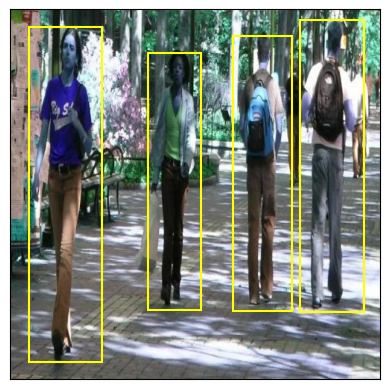

In [ ]:
img_name = 'people_442'
img = cv.imread("/content/drive/MyDrive/yolo_input/images/"+img_name+".jpg")
plt.imshow(img)
label = open('/content/drive/MyDrive/yolo_input/labels/'+img_name+'.txt')
bbox_list = list(map(lambda x: x.replace('\n','').split()[1:],label.readlines()))
bbox_list

for bbox in bbox_list:
  bbox = [float(bbox[0]), float(bbox[1]), float(bbox[2]), float(bbox[3])]
  bbox = yolo_to_xml_bbox(bbox,img)
  xmin, xmax, ymin, ymax = bbox
  rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.5, edgecolor='yellow', fill=False)
  ax = plt.gca()
  ax.add_patch(rect)

  plt.xticks([]); plt.yticks([])
  plt.imshow(img)


## image train&test split

In [ ]:
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.3, random_state=42)

print(len(train_img_list), len(val_img_list))

4211 1806


In [ ]:
with open('/content/drive/MyDrive/mobil/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/drive/MyDrive/mobil/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list) + '\n')

In [ ]:
import yaml

with open('/content/drive/MyDrive/yolo_input/data.yaml', 'r') as f:
  data = yaml.full_load(f)

print(data)

data['train'] = '/content/drive/MyDrive/yolo_input/train.txt'
data['val'] = '/content/drive/MyDrive/yolo_input/val.txt'

with open('/content/drive/MyDrive/yolo_input/data.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'names': ['crutches', 'wheelchair', 'pedestrian'], 'nc': 3, 'train': '/content/drive/MyDrive/yolo_input/train.txt', 'val': '/content/drive/MyDrive/yolo_input/val.txt'}
{'names': ['crutches', 'wheelchair', 'pedestrian'], 'nc': 3, 'train': '/content/drive/MyDrive/yolo_input/train.txt', 'val': '/content/drive/MyDrive/yolo_input/val.txt'}


## Train YOLOV5

In [ ]:
%cd /content/drive/MyDrive/yolov5/

!python train.py --img 418 --batch 32 --epochs 50 --data /content/drive/MyDrive/yolo_input/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name yolov5s_results

/content/drive/MyDrive/yolov5
train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/drive/MyDrive/yolo_input/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=418, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 6 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_mom

In [ ]:
%cd /content/drive/MyDrive/yolov5/

!python train.py --img 418 --batch 32 --epochs 50 --data /content/drive/MyDrive/yolo_input/data.yaml --cfg ./models/yolov5n.yaml --weights yolov5n.pt --name yolov5n_results

/content/drive/MyDrive/yolov5
train: weights=yolov5n.pt, cfg=./models/yolov5n.yaml, data=/content/drive/MyDrive/yolo_input/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=418, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5n_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, ob

## YOOLOV5 평가지표 확인

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/yolov5/runs/

Output hidden; open in https://colab.research.google.com to view.

# YOLO V5 inference

In [ ]:
%cd /content/drive/MyDrive/yolov5/

!python val.py --weights ./runs/train/yolov5n_results/weights/best.pt --data /content/drive/MyDrive/yolo_input/data.yaml --img 418

/content/drive/MyDrive/yolov5
val: data=/content/drive/MyDrive/yolo_input/data.yaml, weights=['./runs/train/yolov5n_results/weights/best.pt'], batch_size=32, imgsz=418, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5n summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
WARNING ⚠️ --img-size 418 must be multiple of max stride 32, updating to 448
val: Scanning /content/drive/MyDrive/yolo_input/val.cache... 1063 images, 1 backgrounds, 0 corrupt: 100% 1063/1063 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 34/34 [00:20<00:00,  1.65it/s]
                   all       1063       1430      0.917  

In [ ]:
%cd /content/drive/MyDrive/yolov5
!python detect.py --weights ./runs/train/yolov5s_results2/weights/best.pt --img 418 --source '/content/drive/MyDrive/yolo_input/val.txt' --save-txt --save-conf

detect: weights=['./runs/train/yolov5s_results2/weights/best.pt'], source=/content/drive/MyDrive/yolo_input/val.txt, data=data/coco128.yaml, imgsz=[418, 418], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [418, 418] must be multiple of max stride 32, updating to [448, 448]
image 1/1063 /content/drive/MyDrive/yolo_input/images/data_0.jpg: 448x320 1 crutches, 39.5ms
image 2/1063 /content/drive/MyDrive/yolo_input/images/data_10.jpg: 320x448 1 crutches, 39.9ms
image 3/1063 /content/drive/MyD

In [ ]:
!python detect.py --weights ./runs/train/yolov5n_results/weights/best.pt --img 418 --source '/content/drive/MyDrive/yolo_input/val.txt' --save-txt --save-conf

detect: weights=['./runs/train/yolov5n_results/weights/best.pt'], source=/content/drive/MyDrive/yolo_input/val.txt, data=data/coco128.yaml, imgsz=[418, 418], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5n summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
WARNING ⚠️ --img-size [418, 418] must be multiple of max stride 32, updating to [448, 448]
image 1/1063 /content/drive/MyDrive/yolo_input/images/data_0.jpg: 448x320 1 crutches, 40.8ms
image 2/1063 /content/drive/MyDrive/yolo_input/images/data_10.jpg: 320x448 1 crutches, 38.8ms
image 3/1063 /content/drive/MyDri

In [ ]:
labels = glob('/content/drive/MyDrive/yolov5/runs/detect/exp12/labels/*.txt')
labeln = glob('/content/drive/MyDrive/yolov5/runs/detect/exp12/labels_s/*.txt')

len(labels),len(labeln)

(707, 709)

# Model ensemble (wbf)

In [ ]:
!pip install ensemble_boxes

In [ ]:
from PIL import Image
from tqdm import tqdm
from ensemble_boxes import *

def xywh2x1y1x2y2(bbox):
    x1 = bbox[0] - bbox[2]/2
    x2 = bbox[0] + bbox[2]/2
    y1 = bbox[1] - bbox[3]/2
    y2 = bbox[1] + bbox[3]/2
    return ([x1,y1,x2,y2])

def x1y1x2y22xywh(bbox):
    x = (bbox[0] + bbox[2])/2
    y = (bbox[1] + bbox[3])/2
    w = bbox[2] - bbox[0]
    h = bbox[3] - bbox[1]
    return ([x,y,w,h])

IMG_PATH = '/content/drive/MyDrive/yolo_input/images/'
TXT_PATH = '/content/drive/MyDrive/yolov5/runs/detect/exp15/'

OUT_PATH = '/content/drive/MyDrive/yolov5/runs/detect/ensemble_sn55/'


MODEL_NAME = os.listdir(TXT_PATH)
# MODEL_NAME = ['test1','test2']

# ===============================
# Default WBF config (you can change these)
iou_thr = 0.55
skip_box_thr = 0.01
# skip_box_thr = 0.0001
sigma = 0.01
# boxes_list, scores_list, labels_list, weights=weights,
# ===============================

# image_ids = os.listdir(IMG_PATH)
image_id = open('/content/drive/MyDrive/yolo_input/val.txt','r')
image_ids = image_id.readlines()

for image_id in tqdm(image_ids, total=len(image_ids)):
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    for name in MODEL_NAME:
        # print(name)
        box_list = []
        score_list = []
        label_list = []
        txt_file = TXT_PATH +name+'/'+ image_id.split('/')[-1].replace('jpg', 'txt').replace('\n','')
        # print(txt_file)
        if os.path.isfile(txt_file):
            txt_df = pd.read_csv(txt_file,header=None,sep=' ').values
            # print(txt_df)
            for row in txt_df:
                box_list.append(xywh2x1y1x2y2(row[1:5]))
                score_list.append(row[5])
                label_list.append(int(row[0]))
            boxes_list.append(box_list)
            scores_list.append(score_list)
            labels_list.append(label_list)
            weights.append(1.0)
        else:
            continue


    boxes, scores, labels = weighted_boxes_fusion(boxes_list, scores_list, labels_list, weights=weights, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    if not os.path.exists(OUT_PATH):
        os.makedirs(OUT_PATH)
    out_file = open(OUT_PATH + image_id.split('/')[-1].replace('jpg', 'txt').replace('\n',''), 'w')

    for i,row in enumerate(boxes):
        img = Image.open(image_id.replace('\n',''))
        img_size = img.size
        bbox = x1y1x2y22xywh(row)
        out_file.write(str(int(labels[i])) + ' ' +" ".join(str(x) for x in bbox) + " " + str(round(scores[i],6)) + '\n')
    out_file.close()

  0%|          | 0/1063 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ensemble_boxes/ensemble_boxes_wbf.py:63: UserWarning: Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')
  1%|          | 7/1063 [00:00<00:17, 61.32it/s]/usr/local/lib/python3.10/dist-packages/ensemble_boxes/ensemble_boxes_wbf.py:63: UserWarning: Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')
  6%|▌         | 63/1063 [00:45<23:15,  1.40s/it]/usr/local/lib/python3.10/dist-packages/ensemble_boxes/ensemble_boxes_wbf.py:63: UserWarning: Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')
  8%|▊         | 88/1063 [01:22<22:18,  1.37s/it]/usr/local/lib/pyth

## ensemble detect 부분 이미지에 확인해보기.

In [ ]:
def yolo_to_xml_bbox(bbox, image): #위 좌표 변환 함수가 잘 된 것인지 다시 변환하여 이미지에 mapping해보기위해 함수를 따로 만든 것.
    # x_center, y_center width, heigth
    h, w, c = image.shape
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2
    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)
    return (xmin, xmax, ymin, ymax)

In [ ]:
def convert(size, box):
    dw = 1./(size[0])
    dh = 1./(size[1])
    x = (box[0] + box[1])/2.0 - 1
    y = (box[2] + box[3])/2.0 - 1
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)
    # left, top , right, bottom

crutches
['crutches 108 55 446 908\n']


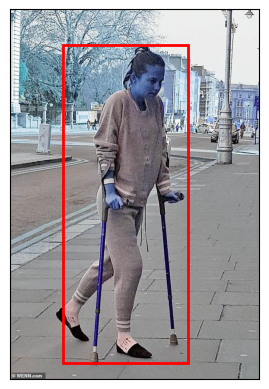

In [ ]:
file_name = 'data_0'
img_path = "//content/drive/MyDrive/input/image_input/"+file_name+".jpg"
img = cv.imread(img_path)
plt.imshow(img)

annotation = open('/content/drive/MyDrive/input/ensemble_sn/'+file_name+'.txt','r')
ann_read = annotation.readlines()
for ann in ann_read:
  bbox = list(map(float,ann.split()[2:6]))
  # bbox = yolo_to_xml_bbox(bbox,img)
  xmin, ymax, xmax, ymin  = bbox
  rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor='red', fill=False)
  ax = plt.gca()
  ax.add_patch(rect)
  print(ann.split()[0])
plt.xticks([]); plt.yticks([])
plt.show
a = open('/content/drive/MyDrive/input/labels/'+file_name+'.txt','r')
aa = a.readlines()

print(aa)

crutches
['crutches 108 55 446 908\n']


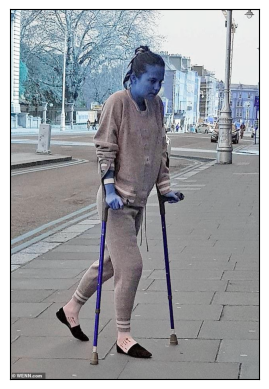

In [ ]:
file_name = 'data_0'
img_path = "//content/drive/MyDrive/input/image_input/"+file_name+".jpg"
img = cv.imread(img_path)
plt.imshow(img)

annotation = open('/content/drive/MyDrive/input/ensemble_sn/'+file_name+'.txt','r')
ann_read = annotation.readlines()
for ann in ann_read:
  bbox = list(map(float,ann.split()[2:6]))
  bbox = yolo_to_xml_bbox(bbox,img)
  xmin, ymax, xmax, ymin  = bbox
  rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor='red', fill=False)
  ax = plt.gca()
  ax.add_patch(rect)
  print(ann.split()[0])
plt.xticks([]); plt.yticks([])
plt.show
a = open('/content/drive/MyDrive/input/labels/'+file_name+'.txt','r')
aa = a.readlines()

print(aa)

# 앙상블 평가지표 계산 part

In [ ]:
def IoU(box1, box2):
    # box = (x1, y1, x2, y2)
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    # obtain x1, y1, x2, y2 of the intersection
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # compute the width and height of the intersection
    w = max(0, x2 - x1 + 1)
    h = max(0, y2 - y1 + 1)

    inter = w * h
    iou = inter / (box1_area + box2_area - inter)
    return iou

In [ ]:
box1 = ['0.6469093263149261', '0.5715162754058838', '0.2519853711128235', '0.624059796333313']
box2 = ['0.64453125', '0.5717781402936378', '0.25390625', '0.6133768352365416']
box1 = list(map(float,box1))
box2 = list(map(float,box2))
IoU(box1,box2)

0.9826922959228926

In [ ]:
val = glob('/content/drive/MyDrive/yolov5/runs/detect/ensemble_sn/*.txt')
an = ['/content/drive/MyDrive/yolo_input/labels/'+name.split('/')[-1] for name in val]
val.sort()
an.sort()
c = 0
for v,a in zip(val,an):

  ensemble = open(v,'r')
  answer = open(a,'r')

  er = ensemble.readlines()
  ar = answer.readlines()
  er.sort()
  ar.sort()

  for e in er:
    print('ensemble:',e.split()[0],end='  ')
    print('[box]:',e.split()[1:5],'   ', e[-1],end='')
  for a in ar:
    print('answer:',a.split()[0],end='  ')
    print('[box]:',a.split()[1:5])
    c+=1
  if len(er) != len(ar):
    print(v)
  print()

ensemble: 0  [box]: ['0.4605996087193489', '0.5252651385962963', '0.5015354007482529', '0.8632886782288551']     
answer: 0  [box]: ['0.43600946372239746', '0.5113936170212766', '0.5340220820189274', '0.9072978723404256']

ensemble: 0  [box]: ['0.2952471226453781', '0.5203566402196884', '0.17950573563575745', '0.6895336210727692']     
answer: 0  [box]: ['0.29181999999999997', '0.5180180180180181', '0.17455', '0.6592942942942942']

ensemble: 0  [box]: ['0.0984399956651032', '0.5365895330905914', '0.1927134906873107', '0.8066011071205139']     
answer: 0  [box]: ['0.1', '0.5166666666666667', '0.19791666666666666', '0.7592592592592593']

ensemble: 0  [box]: ['0.10363988659810275', '0.5041537489742041', '0.20518529252149165', '0.9916920252144337']     
answer: 0  [box]: ['0.1015625', '0.500925925925926', '0.20104166666666667', '0.9981481481481482']

ensemble: 0  [box]: ['0.10390080575598404', '0.5009197493782267', '0.20675301423761994', '0.9981607396621257']     
answer: 0  [box]: ['0.101

## mAP 평가지표 계산 part

In [ ]:
def convert_yolo_to_voc(x_c_n, y_c_n, width_n, height_n, img_width, img_height):
    ## remove normalization given the size of the image
    x_c = float(x_c_n) * img_width
    y_c = float(y_c_n) * img_height
    width = float(width_n) * img_width
    height = float(height_n) * img_height
    ## compute half width and half height
    half_width = width / 2
    half_height = height / 2
    ## compute left, top, right, bottom
    ## in the official VOC challenge the top-left pixel in the image has coordinates (1;1)
    left = int(x_c - half_width) + 1
    top = int(y_c - half_height) + 1
    right = int(x_c + half_width) + 1
    bottom = int(y_c + half_height) + 1
    return left, top, right, bottom

In [ ]:
detect_list = glob('/content/drive/MyDrive/input/ensemble_sn/*.txt')
true_list = glob('/content/drive/MyDrive/input/labels/*.txt')
img_list = glob('/content/drive/MyDrive/input/image_input/*.jpg')
len(detect_list),len(true_list),len(img_list)

(1063, 1063, 1063)

In [ ]:
val_names = open('/content/drive/MyDrive/yolo_input/val.txt')
val_names = list(map(lambda x: x.replace('\n',''),val_names.readlines()))
val_names[0]
# print(len(val_names))

'/content/drive/MyDrive/yolo_input/images/data_1987.jpg'

In [ ]:
for path in tqdm(val_names):
  path = os.path.basename(path)
  f = open('/content/drive/MyDrive/yolo_input/labels/'+path.replace('jpg','txt'), 'r')
  h = open('/content/drive/MyDrive/input/labels/'+path.replace('jpg','txt'),'w')

  data = f.read()
  h.write(data)

  f.close()
  h.close()

  1%|          | 7/1063 [00:11<28:36,  1.63s/it]


KeyboardInterrupt: ignored

In [ ]:
for img_path in tqdm(val_names):
  img_path = img_path.replace('\n','')
  im = Image.open(img_path).convert('RGB')
  im.save('/content/drive/MyDrive/input/'+img_path.split('/')[-1])

100%|██████████| 1063/1063 [01:08<00:00, 15.51it/s]


In [ ]:
object_name = {'0':'crutches','1':'wheelchair','2':'pedestrian'}
detect_list = glob('/content/drive/MyDrive/yolov5/runs/detect/ensemble_sn55/*.txt')
# true_list = glob('/content/drive/MyDrive/input/labels/*.txt')
detect_list.sort()
# true_list.sort()

# for detect ,true in tqdm(zip(detect_list,true_list)):
for detect in tqdm(detect_list):
  detect_txt = open(detect,'r')
  # true_txt = open(true,'r')

  img_path = "/content/drive/MyDrive/yolo_input/images/"+detect.split('/')[-1].replace('txt','jpg')
  img = cv.imread(img_path)

  de_label = detect_txt.readlines()
  # tr_label = true_txt.readlines()

  new_detect_list = []
  # new_true_list = []
  for w_d in de_label:
    w_d = w_d.split()
    bbox = convert_yolo_coordinates_to_voc(w_d[1],w_d[2],w_d[3],w_d[4],img.shape[1],img.shape[0])
    new_detect = object_name[w_d[0]] +' '+ w_d[-1].replace('\n','') +' '+ ' '.join(list(map(str,bbox)))
    new_detect_list.append(new_detect)

  # for w_t in tr_label:
  #   w_t = w_t.split()
  #   bbox = convert_yolo_coordinates_to_voc(w_t[1],w_t[2],w_t[3],w_t[4],img.shape[1],img.shape[0])
  #   print(bbox)
  #   new_true = object_name[w_t[0]]+' ' + ' '.join(list(map(str,bbox)))
  #   new_true_list.append(new_true)
  # print(new_detect_list)
  # print(new_true_list)

  rewrite_detect = open(detect,'w')
  for d in new_detect_list:
    rewrite_detect.write(d+'\n')
  rewrite_detect.close()

  # rewrite_true = open(true,'w')
  # for t in new_true_list:
  #   rewrite_true.write(t+'\n')
  # rewrite_true.close()

100%|██████████| 1063/1063 [00:53<00:00, 19.98it/s]


# Retinanet Model training

In [ ]:
total_image = glob('data/images/*.png')
total_label = glob('data/labels/*.txt')

In [ ]:
from sklearn.model_selection import train_test_split

train_data, val_data = train_test_split(total_label, test_size=0.3, random_state=42)

print(len(train_data), len(val_data))

train_data[0]


4960 2126


'data/labels/data_17.txt'

In [ ]:
def deee():
    u = [1,2,3,4]
    return u

a = deee()[0]
a

1

In [ ]:
a = open(train_data[-2],'r')
a.readlines()

['1 0.24791666666666667 0.6574074074074074 0.2875 0.6851851851851852\n',
 '0 0.5744791666666667 0.4564814814814815 0.11145833333333333 0.39814814814814814\n']

In [ ]:
int(float('1.000'))

1

In [ ]:
object_name = {'0':'crutches','1':'wheelchair','2':'pedestrian'}

file_name = train_data #if you want another file list, you change here! (val_data)

retina_list = []

for file in tqdm(file_name):
  txt_file = open(file,'r')
  txt_label = txt_file.readlines()

  img_path = file.replace('.txt','.png').replace('labels','images')
  img = cv.imread(img_path)

  for w_d in txt_label:
    w_d = w_d.split()
    bbox = convert_yolo_to_voc(w_d[1],w_d[2],w_d[3],w_d[4],img.shape[1],img.shape[0])

    detect = [img_path,bbox[0],bbox[1],bbox[2],bbox[3],object_name[str(int(float(w_d[0])))]]
    retina_list.append(detect)

print(retina_list)
  
  # rewrite_detect = open(detect,'w')
  # for d in new_detect_list:
  #   rewrite_detect.write(d+'\n')
  # rewrite_detect.close()

  # # rewrite_true = open(true,'w')
  # # for t in new_true_list:
  # #   rewrite_true.write(t+'\n')
  # # rewrite_true.close()

  # 68	175	155	348  left top right bottom

100%|██████████| 4960/4960 [01:29<00:00, 55.55it/s] 

[['data/images/data_17.png', 46, 24, 376, 693, 'crutches'], ['data/images/aug_data_430.png', 138, 156, 333, 300, 'wheelchair'], ['data/images/data_1435.png', 358, 182, 531, 474, 'wheelchair'], ['data/images/data_1586.png', 499, 144, 747, 703, 'crutches'], ['data/images/data_2168.png', 1273, 1422, 2327, 4520, 'crutches'], ['data/images/data_1997.png', 38, 15, 129, 294, 'crutches'], ['data/images/aug_data_2412.png', 53, 32, 158, 239, 'crutches'], ['data/images/data_967.png', 620, 97, 760, 477, 'crutches'], ['data/images/aug_data_1804.png', 38, 2, 155, 270, 'crutches'], ['data/images/data_682.png', 388, 44, 545, 490, 'crutches'], ['data/images/aug_data_1416.png', 431, 181, 595, 448, 'wheelchair'], ['data/images/data_1848.png', 105, 200, 286, 539, 'crutches'], ['data/images/data_879.png', 315, 195, 438, 372, 'wheelchair'], ['data/images/aug_people_62.png', 307, 238, 375, 608, 'pedestrian'], ['data/images/aug_people_62.png', 381, 249, 443, 582, 'pedestrian'], ['data/images/aug_people_62.png

In [ ]:
len(retina_list)

6889

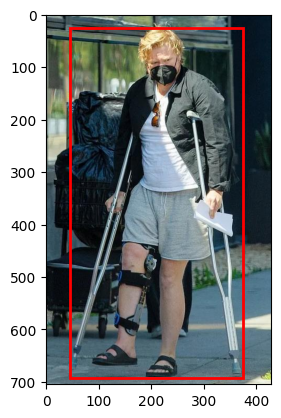

In [ ]:
a = Image.open('data/images/data_17.png')
b = np.array(a)

left, top, right, bottom = 46, 24, 376, 693
rect = patches.Rectangle((left, bottom), right-left, top-bottom, linewidth=2, edgecolor='red', fill=False)
# cv2.rectangle(draw_img, (left, top), (right, bottom), color=green_color, thickness=1)
ax = plt.gca()
ax.add_patch(rect)

plt.imshow(b)

In [ ]:
!apt-get install tk-dev python-tk

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tk-dev is already the newest version (8.6.11+1build2).
python-tk is already the newest version (2.7.18-1build1).
0 upgraded, 0 newly installed, 0 to remove and 9 not upgraded.


In [ ]:
import csv
f = open('/content/drive/MyDrive/pytorch-retinanet/class_csv.csv', 'w',newline='',)
data = [['crutches','0'],['wheelchair','1'],['pedestrian','2']]
writer = csv.writer(f)
writer.writerows(data)
f.close()

In [ ]:
pd.read_csv('/content/drive/MyDrive/pytorch-retinanet/class_csv.csv',header=None)

,0,1
0,crutches,0
1,wheelchair,1
2,pedestrian,2


In [ ]:
def yolo_to_xml_bbox(bbox, image): #위 좌표 변환 함수가 잘 된 것인지 다시 변환하여 이미지에 mapping해보기위해 함수를 따로 만든 것.
    # x_center, y_center width, heigth
    h, w, c = image.shape
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2
    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)
    return xmin, ymax, xmax, ymin


In [ ]:
def covert_set(img_path,s,img):
  class_list = ['crutches','wheelchair','pedestrian']

  l = s.replace('\n','').split()
  # class_list[int(float(l[0]))]
  bbox = list(map(float,l[1:]))
  xmin,ymax,xmax,ymin = yolo_to_xml_bbox(bbox,img)

  result = '{path},{xmin},{ymin},{xmax},{ymax},{cls}'.format(path=img_path,xmin=xmin,ymin=ymin, xmax=xmax, ymax=ymax, cls=class_list[int(float(l[0]))])

  return result


## train_annotation

In [ ]:
t_p = open('/content/drive/MyDrive/yolo_input/train.txt','r')
train_path = t_p.readlines()
train_path = list(map(lambda x: x[:-1],train_path))
train_path[:5]


[]

In [ ]:
pd.read_csv('/content/drive/MyDrive/pytorch-retinanet/train_annots.csv')

,/content/drive/MyDrive/yolo_input/images/aug_data_440.jpg,68,175,155,348,wheelchair
0,/content/drive/MyDrive/yolo_input/images/aug_d...,226,155,316,337,wheelchair
1,/content/drive/MyDrive/yolo_input/images/aug_d...,75,166,212,416,wheelchair
2,/content/drive/MyDrive/yolo_input/images/aug_d...,51,24,366,403,wheelchair
3,/content/drive/MyDrive/yolo_input/images/aug_d...,117,104,331,416,wheelchair
4,/content/drive/MyDrive/yolo_input/images/aug_d...,102,131,335,415,wheelchair
...,...,...,...,...,...,...
6907,/content/drive/MyDrive/yolo_input/images/data_...,1,73,175,518,crutches
6908,/content/drive/MyDrive/yolo_input/images/data_...,377,181,487,385,wheelchair
6909,/content/drive/MyDrive/yolo_input/images/data_...,116,134,643,881,wheelchair
6910,/content/drive/MyDrive/yolo_input/images/data_...,549,45,873,690,crutches


In [ ]:
csv_train_annotation = []
for im in tqdm(train_path):
  img = cv.imread(im)
  # print(im)
  txt_path = im.replace('images','labels').replace('jpg','txt')
  # print(txt_path)
  txt = open(txt_path,'r')
  for s in txt.readlines():
    csv_train_annotation.append(covert_set(im,s,img))

0it [00:00, ?it/s]


In [ ]:
len(csv_train_annotation)

6914

In [ ]:
train_data = [csv_train_annotation[i].split(',') for i in range(len(csv_train_annotation))]

In [ ]:
train_data

In [ ]:
train_annots = open('/content/drive/MyDrive/pytorch-retinanet/train_annots.csv', 'w',newline='',)
writer = csv.writer(train_annots)
writer.writerows(train_data)
train_annots.close()

## val_annotation

In [ ]:
v_p = open('/content/drive/MyDrive/yolo_input/val.txt','r')
val_path = v_p.readlines()
val_path = list(map(lambda x: x[:-1],val_path))
val_path[:5]

['/content/drive/MyDrive/yolo_input/images/data_1987.jpg',
 '/content/drive/MyDrive/yolo_input/images/data_1018.jpg',
 '/content/drive/MyDrive/yolo_input/images/data_1374.jpg',
 '/content/drive/MyDrive/yolo_input/images/data_2612.jpg',
 '/content/drive/MyDrive/yolo_input/images/data_1980.jpg']

In [ ]:
csv_val_annotation = []
for im in tqdm(val_path):
  img = cv.imread(im)
  # print(im)
  txt_path = im.replace('images','labels').replace('jpg','txt')
  # print(txt_path)
  txt = open(txt_path,'r')
  for s in txt.readlines():
    csv_val_annotation.append(covert_set(im,s,img))

100%|██████████| 1063/1063 [31:34<00:00,  1.78s/it]


In [ ]:
len(csv_val_annotation)

1430

In [ ]:
val_data = [csv_val_annotation[i].split(',') for i in range(len(csv_val_annotation))]

In [ ]:
val_annots = open('/content/drive/MyDrive/pytorch-retinanet/val_annots.csv', 'w',newline='',)
writer = csv.writer(val_annots)
writer.writerows(val_data)
val_annots.close()

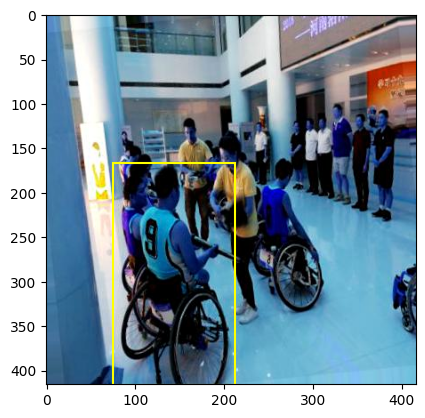

In [ ]:
im = '/content/drive/MyDrive/yolo_input/images/aug_data_440.jpg'
img = cv.imread(im)
xmin, ymax, xmax, ymin =75,416,212,166
plt.imshow(img)
rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.5, edgecolor='yellow', fill=False)
ax = plt.gca()
ax.add_patch(rect)
plt.show()

## model retinanet train

In [1]:
!pip install torch==1.13.0+cu116 torchvision==0.14.0+cu116 torchaudio==0.13.0 --extra-index-url https://download.pytorch.org/whl/cu116

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu116
ERROR: Could not find a version that satisfies the requirement torch==1.13.0+cu116 (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1)
ERROR: No matching distribution found for torch==1.13.0+cu116


In [3]:
import torch
torch.__version__

'1.13.0'

In [ ]:
%cd /content
!git clone https://github.com/yhenon/pytorch-retinanet.git

/content
fatal: destination path 'pytorch-retinanet' already exists and is not an empty directory.


In [ ]:
%cd /content/pytorch-retinanet

/content/pytorch-retinanet


In [6]:

!python train.py --dataset csv --csv_train /content/pytorch-retinanet/train_annot.csv  --csv_classes /content/pytorch-retinanet/class_csv.csv  --csv_val /content/pytorch-retinanet/val_annots.csv --epochs 50

zsh:cd:1: no such file or directory: /Users/hyundolee/data_story/A-Study-on-Traffic-Vulnerable-Detection-Using-Object-Detection-Based-Esemble/pytorch-retinanet


python: can't open file '/Users/hyundolee/data_story/A-Study-on-Traffic-Vulnerable-Detection-Using-Object-Detection-Based-Esemble/train.py': [Errno 2] No such file or directory


In [ ]:
(0.9860330179341777+0.9798255962447975+0.7484717711886377)/3

0.9047767951225376

In [8]:
!cd ./pytorch-retinanet
!python visualize_single_image.py --image_dir "/content/drive/MyDrive/pytorch-retinanet/images" --model_path "/content/drive/MyDrive/pytorch-retinanet/model_final.pt" --class_list "/content/drive/MyDrive/pytorch-retinanet/rt_class.csv"

zsh:cd:1: no such file or directory: ./pytorch-retinanet


python: can't open file '/Users/hyundolee/data_story/A-Study-on-Traffic-Vulnerable-Detection-Using-Object-Detection-Based-Esemble/visualize_single_image.py': [Errno 2] No such file or directory


In [ ]:
python3 visualize_single_image.py --image_dir "images/" --model_path "model_final.pt" --class_list "rt_class.csv"

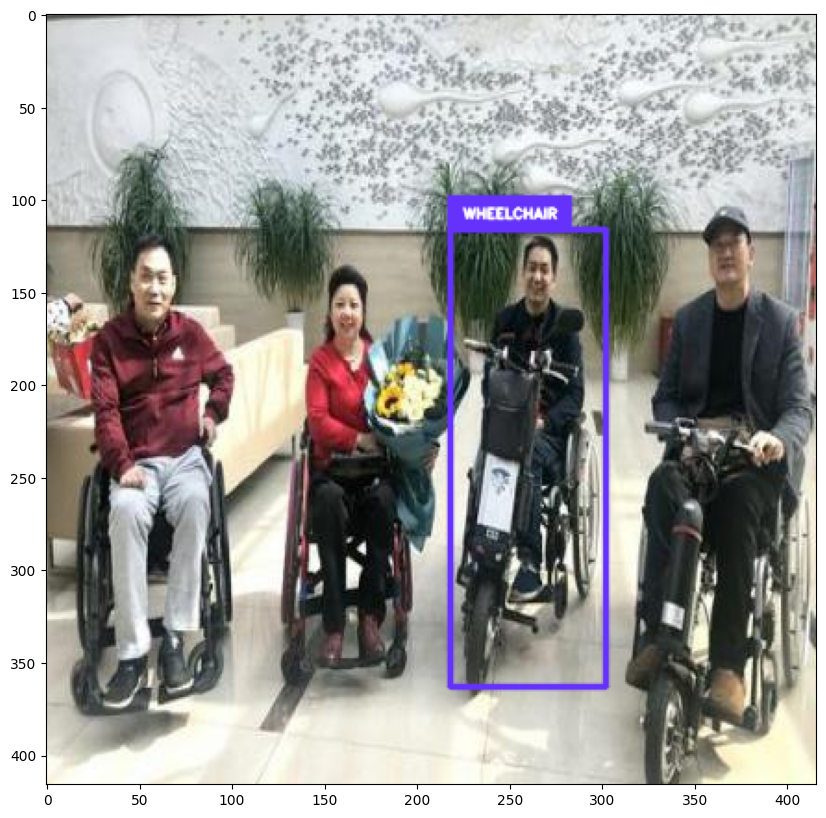

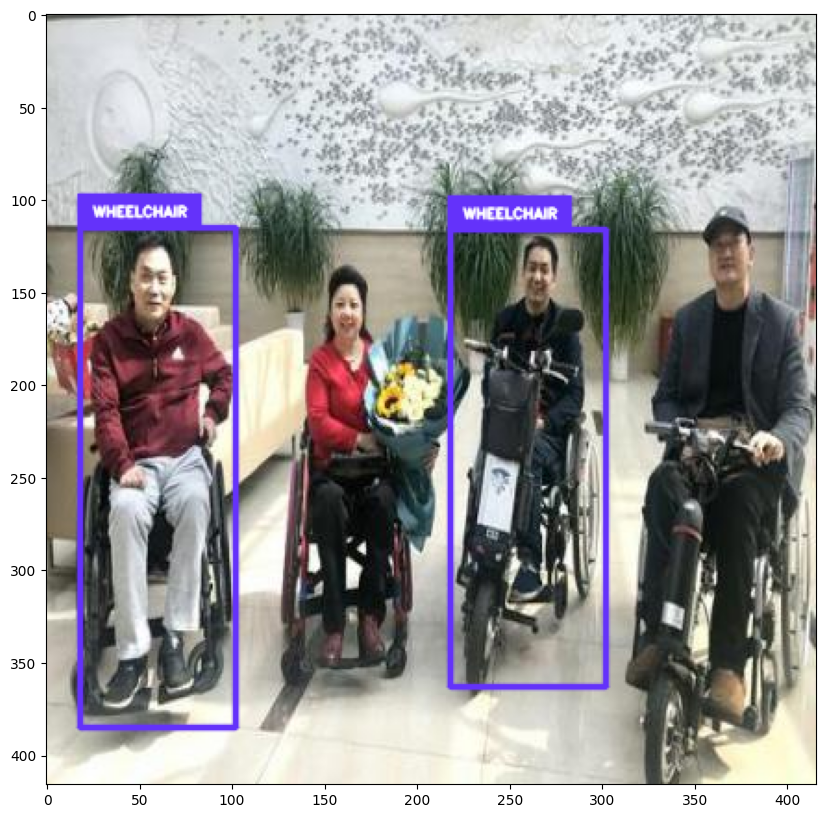

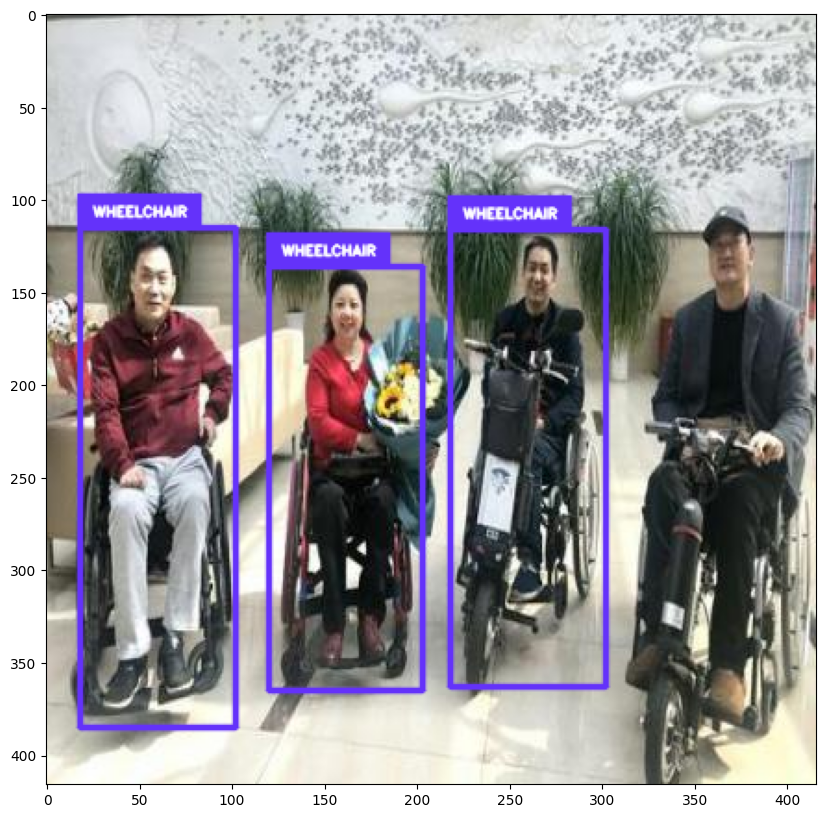

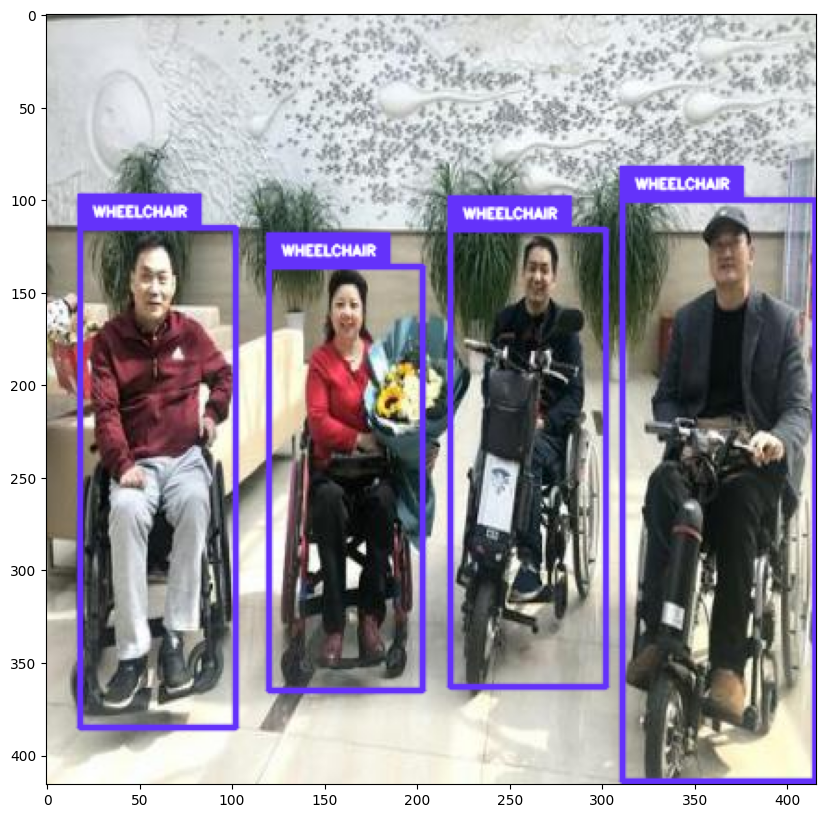

In [4]:
from PIL import ImageColor
import numpy as np
import cv2
import matplotlib.pyplot as plt

def yolo_to_xml_bbox(bbox, image): #위 좌표 변환 함수가 잘 된 것인지 다시 변환하여 이미지에 mapping해보기위해 함수를 따로 만든 것.
    # x_center, y_center width, heigth
    h, w, c = image.shape
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2
    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)
    return (xmin, xmax, ymin, ymax)


def plot_box(image, top_left_point, bottom_right_point, width, height, label, color=(100,50,250), padding=6, font_scale=0.5):
    label = label.upper()

    cv2.rectangle(image, (top_left_point['x'] - 1, top_left_point['y']), (bottom_right_point['x'], bottom_right_point['y']), color, thickness=2, lineType=cv2.LINE_AA)
    res_scale = (image.shape[0] + image.shape[1])/1600
    font_scale = font_scale * res_scale
    font_width, font_height = 0, 0
    font_face = cv2.FONT_HERSHEY_DUPLEX
    text_size = cv2.getTextSize(label, font_face, fontScale=font_scale, thickness=1)[0]

    if text_size[0] > font_width:
        font_width = text_size[0]
    if text_size[1] > font_height:
        font_height = text_size[1]
    if top_left_point['x'] - 1 < 0:
        top_left_point['x'] = 1
    if top_left_point['x'] + font_width + padding*2 > image.shape[1]:
        top_left_point['x'] = image.shape[1] - font_width - padding*2
    if top_left_point['y'] - font_height - padding*2  < 0:
        top_left_point['y'] = font_height + padding*2
    
    p3 = top_left_point['x'] + font_width + padding*2, top_left_point['y'] - font_height - padding*2
    cv2.rectangle(image, (top_left_point['x'] - 2, top_left_point['y']), p3, color, -1, lineType=cv2.LINE_AA)
    x = top_left_point['x'] + padding
    y = top_left_point['y'] - padding
    cv2.putText(image, label, (x, y), font_face, font_scale, [255, 255, 255], thickness=1, lineType=cv2.LINE_AA)

    return image

image_path = 'data/images/data_85.png'
txt_path = 'data/labels/data_85.txt'
class_name = {0:'crutches',1:'wheelchair',2:'pedestrian'}

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
with open(txt_path, 'r') as f:
    lines = f.readlines()
    for line in lines:
        line = line.strip().split(' ')
        class_index = line[0]
        x_center, y_center, width, height = float(line[1]), float(line[2]), float(line[3]), float(line[4])
        xmin, xmax, ymin, ymax = yolo_to_xml_bbox([x_center, y_center, width, height], image)
        plt.figure(figsize=(10, 10))
        image = plot_box(image, {'x':xmin, 'y':ymin}, {'x':xmax, 'y':ymax}, width, height, class_name[int(class_index)])
        plt.imshow(image)